# Pre-processing

Later on, rather than having dozens of images for each city, it will be useful to work with a single image per city. In geographic information systems (GIS) lingo, we need to create a mosaic of each city by combining the many overlapping tiles that were downloaded initially.

In [2]:
import subprocess
import rasterio
import json
import os

from matplotlib import pyplot as plt
from helpers import rio_open

import numpy as np
%matplotlib inline

Rather than mosaicing in pure Python, we'll make use of the super-fast GDAL program. First, GDAL is used to create a virtual dataset which is essentially a file that points to multiple images without actually constructing an entirely new image. However, since we do in fact want the a new image file, GDAL is then used to convert the virtual dataset to a single, large image file. The steps are wrapped up in the Python function `make_gdal_mosaic` which makes the appropriate shell calls to GDAL.

In [3]:
def make_gdal_mosaic(tif_list_path, vrt_path, tif_path):
    '''
    Takes a text file containing 1+ geoTIFFs (tif_list_path) and converts it into a
    single mosaic in the form of a small VRT file (vrt_path) and a compressed 
    geoTIFF (tif_path)
    
    Assumes gdal utilities gdalbuildvrt and gdal_translate are available by the shell.
    '''
    cmd = 'gdalbuildvrt -input_file_list {} {}'.format(tif_list_path, vrt_path, tif_path)
    subprocess.run(cmd, shell = True)
    cmd = 'gdal_translate  -co tiled=yes -co bigtiff=yes -co compress=jpeg -co photometric=ycbcr {} {}'.format(vrt_path, tif_path)
    subprocess.run(cmd, shell = True)

We apply the mosaicing procedure to each city and update the info dictionaries with the path to the new mosaic file.

In [5]:
with open('data/naip/download_info.json', 'r') as places_in:
    places = json.load(places_in)

mosaic_dir = 'data/naip/img/mosaic/'
for place, place_info in places.items():
    
    ## Make computer-friendly filepaths
    place_name = place.lower().replace(' ', '_')
    place_basepath = mosaic_dir + place_name
    tif_list_path = place_basepath + '_img_paths.txt'
    vrt_path = place_basepath + '.vrt'
    tif_path = place_basepath + '.tif'

    ## Make mosaic if it doesn't already exist
    if os.path.isfile(tif_path):
        print('Skipping {}\n'.format(place))
    else:  
        print('Making mosaic for {}\n'.format(place))
        img_paths = place_info['img_paths']
        with open(tif_list_path, 'w') as f:
            for path in img_paths:
                f.write(path + '\n')
        make_gdal_mosaic(tif_list_path, vrt_path, tif_path)
    
    ## Log the new image
    place_info['mosaic'] = tif_path

## Log new dictionary info to hard drive
with open('data/naip/download_info.json', 'w') as places_out:
    json.dump(places, places_out, sort_keys = True, indent = 4)

Making mosaic for Bullhead

Making mosaic for Flagstaff

Making mosaic for Globe

Making mosaic for Lake Havasu City

Making mosaic for Phoenix

Making mosaic for Tuscon

Making mosaic for Yuma



An example is displayed below. Because of their large size, to view the mosaics in full detail you'll need a beefed up image viewer like GIMP or Photoshop or Feh. For geotiffs specifically, we can also use GIS programs like [QGIS Desktop](https://qgis.org/en/site/).

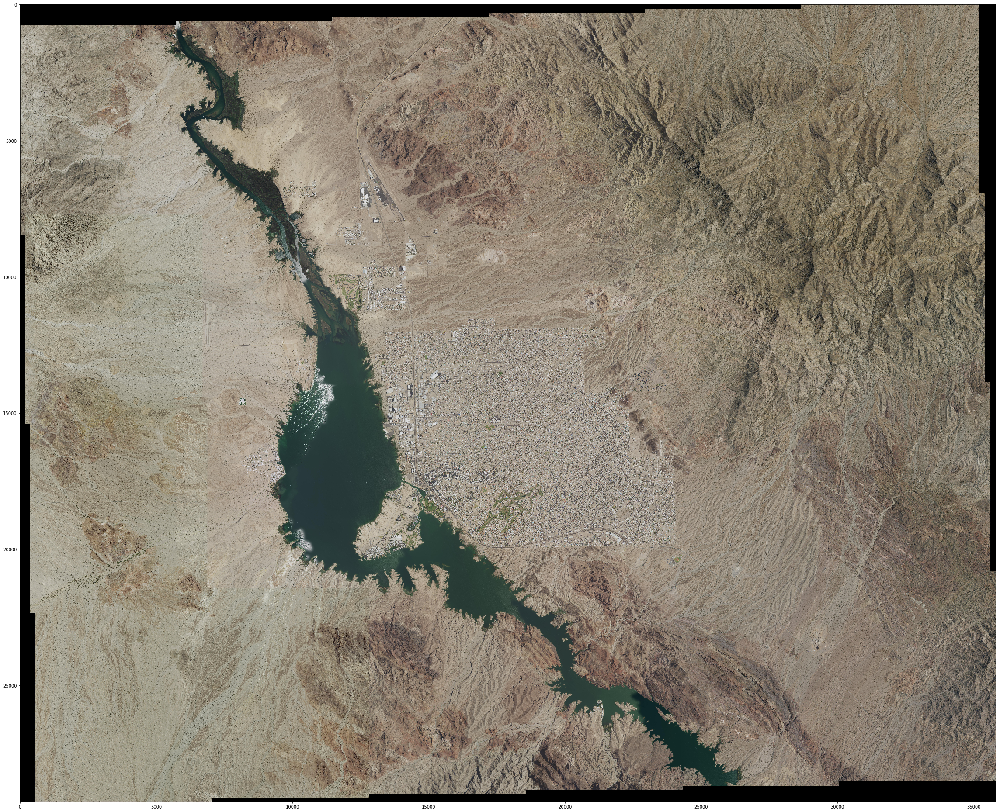

In [3]:
mosaic = rio_open(places['Lake Havasu City']['mosaic'])
fig, ax = plt.subplots(1, 1, figsize = (40, 40))
ax.imshow(mosaic)